In [1]:
#1:安裝

!pip install -q git+https://github.com/openai/CLIP.git
!pip install -q googletrans==4.0.0rc1
!pip install -q scikit-image
!pip install -q opencv-python # 圖像分析
!pip install -q diffusers transformers accelerate invisible-watermark safetensors
!pip install -q ipywidgets

print("1:安裝完成。")

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 837.7 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 43.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 54.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 44.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 52.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
# 2:匯入專案中會用到的所有 Python 模組

import torch
import clip
from PIL import Image, ImageDraw, ImageFont
from googletrans import Translator
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
from skimage.color import rgb2lab
import cv2
from diffusers import StableDiffusionPipeline
import os
from sklearn.metrics.pairwise import cosine_similarity
from tqdm.notebook import tqdm
import time
import textwrap
import matplotlib.font_manager as fm

print("2:函式庫匯入完成。")

2:函式庫匯入完成。


In [3]:
# 3:設定 Matplotlib 字體

print("3:正在設定 Matplotlib CJK 字體...")
font_path_cjk = '/usr/share/fonts/opentype/noto/NotoSansCJKjp-Regular.otf'
if os.path.exists(font_path_cjk):
    try:
        fm.fontManager.addfont(font_path_cjk)
        prop = fm.FontProperties(fname=font_path_cjk)
        font_name = prop.get_name()
        plt.rcParams['font.family'] = font_name
        plt.rcParams['axes.unicode_minus'] = False
        print(f"  已成功設定 CJK 字體為: {font_name}")
    except Exception as e:
        print(f"  設定字體 '{font_path_cjk}' 時發生錯誤: {e}. 退到通用列表。")
        plt.rcParams['font.sans-serif'] = ['DejaVu Sans', 'SimHei', 'sans-serif']
        plt.rcParams['axes.unicode_minus'] = False
else:
    print(f"  指定的 CJK 字體文件路徑不存在: {font_path_cjk}. 退到通用列表。")
    plt.rcParams['font.sans-serif'] = ['DejaVu Sans', 'SimHei', 'sans-serif']
    plt.rcParams['axes.unicode_minus'] = False
print("3:Matplotlib CJK 字體設定完畢。")

3:正在設定 Matplotlib CJK 字體...
  指定的 CJK 字體文件路徑不存在: /usr/share/fonts/opentype/noto/NotoSansCJKjp-Regular.otf. 退到通用列表。
3:Matplotlib CJK 字體設定完畢。


In [4]:
# Cell 4: 設定 PyTorch 的運算設備

if torch.cuda.is_available(): device_to_use = "cuda"
else: device_to_use = "cpu"
print(f"4:本次運行的計算設備是: {device_to_use}")
if device_to_use == "cpu": print("警告：未使用GPU！運行大型AI模型會非常慢。")

4:本次運行的計算設備是: cuda


In [5]:
# 5:載入 OpenAI CLIP 模型

clip_model_name_to_load = "ViT-B/32"
clip_model_instance, clip_image_preprocess_fn = None, None
print(f"5:準備載入 CLIP 模型 ({clip_model_name_to_load})...")
if device_to_use == "cuda":
    try:
        clip_model_instance, clip_image_preprocess_fn = clip.load(clip_model_name_to_load, device=device_to_use)
        clip_model_instance.eval()
        print(f"  CLIP 模型 ({clip_model_name_to_load}) 已成功載入到 {device_to_use}！")
        torch.cuda.empty_cache()
    except Exception as e: print(f"  載入CLIP模型時發生錯誤: {e}")
else: print(f"  未實際載入CLIP模型，因為當前運算設備是 {device_to_use}。")

5:準備載入 CLIP 模型 (ViT-B/32)...


100%|████████████████████████████████████████| 338M/338M [00:02<00:00, 158MiB/s]


  CLIP 模型 (ViT-B/32) 已成功載入到 cuda！


In [6]:
# 6:載入 Stable Diffusion 圖像生成模型

sd_model_id_to_load = "runwayml/stable-diffusion-v1-5"
image_generation_pipeline = None
print(f"6:準備載入 Stable Diffusion 模型 ({sd_model_id_to_load})...")
if device_to_use == "cuda":
    try:
        image_generation_pipeline = StableDiffusionPipeline.from_pretrained(sd_model_id_to_load, torch_dtype=torch.float16)
        image_generation_pipeline = image_generation_pipeline.to(device_to_use)
        print(f"  Stable Diffusion 模型 ({sd_model_id_to_load}) 已成功載入到 {device_to_use}！")
        torch.cuda.empty_cache()
    except Exception as e: print(f"  載入Stable Diffusion模型時發生錯誤: {e}")
else: print(f"  未實際載入Stable Diffusion模型，因為當前運算設備是 {device_to_use}。")

6:準備載入 Stable Diffusion 模型 (runwayml/stable-diffusion-v1-5)...


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  Stable Diffusion 模型 (runwayml/stable-diffusion-v1-5) 已成功載入到 cuda！


In [7]:
# 7:初始化 Google 翻譯工具

google_translator_instance = None
print("7:正在初始化 Google 翻譯工具...")
try:
    google_translator_instance = Translator()
    test_text = "你好"; translated_test_text = google_translator_instance.translate(test_text, src='zh-cn', dest='en').text
    print(f"  Google 翻譯工具初始化成功！測試翻譯 '{test_text}' -> '{translated_test_text}'")
except Exception as e: print(f"  Google 翻譯工具初始化失敗: {e}")

7:正在初始化 Google 翻譯工具...
  Google 翻譯工具初始化成功！測試翻譯 '你好' -> 'Hello'


In [8]:
# 8:定義專案要分析的詞彙概念及多語言翻譯

word_concepts_list = [
    {"concept_name": "cool_ambiguous", "base_chinese": "酷 / 涼爽", "translations": {"zh": "冰涼的飲料，酷炫的風格，冷靜的態度", "en": "cool refreshing drink, cool stylish look, calm and cool attitude", "ja": "冷たい飲み物、かっこいいスタイル、冷静な態度", "ko": "시원한 음료, 멋진 스타일, 침착한 태도"}},
    {"concept_name": "soft_ambiguous", "base_chinese": "柔軟", "translations": {"zh": "柔軟，溫和的觸感，蓬鬆的雲朵", "en": "soft, gentle touch, fluffy clouds", "ja": "柔らかい、優しい手触り、ふわふわの雲", "ko": "부드럽다, 순한 촉감, 푹신한 구름"}},
    {"concept_name": "bright_ambiguous", "base_chinese": "明亮", "translations": {"zh": "明亮的光線，充滿希望的未來，聰明睿智的想法", "en": "bright light, hopeful future, intelligent idea", "ja": "明るい光、希望に満ちた未来、賢いアイデア", "ko": "밝은 빛, 희망찬 미래, 똑똑한 생각"}},
    {"concept_name": "dark_ambiguous", "base_chinese": "黑暗", "translations": {"zh": "漆黑的夜晚，神秘的森林深處，陰沉憂鬱的心情", "en": "dark night, mysterious deep forest, gloomy mood", "ja": "漆黒の夜、神秘的な森の奥、陰鬱な気分", "ko": "칠흑 같은 밤, 신비로운 깊은 숲, 침울한 기분"}},
    {"concept_name": "pure_ambiguous", "base_chinese": "純潔", "translations": {"zh": "純潔的心靈，單純的想法，純淨無瑕的白色", "en": "pure heart, simple idea, pristine flawless white", "ja": "純粋な心、単純な考え、清らかで無垢な白", "ko": "순수한 마음, 단순한 생각, 깨끗하고 티없는 흰색"}},
    {"concept_name": "warm_ambiguous", "base_chinese": "溫暖", "translations": {"zh": "溫暖的陽光灑在身上，壁爐裡溫暖的火焰，熱情的款待", "en": "warm sunshine on the skin, cozy fireplace flames, enthusiastic hospitality", "ja": "肌に注ぐ暖かい日差し、暖炉の暖かい炎、情熱的なもてなし", "ko": "피부에 내리쬐는 따뜻한 햇살, 벽난로의 따뜻한 불꽃, 열정적인 환대"}},
    {"concept_name": "happy_clear", "base_chinese": "快樂", "translations": {"zh": "陽光明媚的日子裡孩子們快樂的笑容，五彩繽紛的派對氣球", "en": "children's happy smiles on a sunny day, colorful party balloons", "ja": "晴れた日の子供たちの幸せな笑顔、カラフルなパーティーバルーン", "ko": "화창한 날 아이들의 행복한 미소, 다채로운 파티 풍선"}},
    {"concept_name": "angry_clear", "base_chinese": "生氣", "translations": {"zh": "因為不公正而生氣的表情，緊握的拳頭，火山爆發的瞬間", "en": "angry expression due to injustice, clenched fists, moment of volcanic eruption", "ja": "不正に対する怒りの表情、握りしめた拳、火山噴火の瞬間", "ko": "불의로 인한 화난 표정, 꽉 쥔 주먹, 화산 폭발의 순간"}},
    {"concept_name": "sad_clear", "base_chinese": "傷心", "translations": {"zh": "因為失去而傷心的眼淚，陰雨連綿的窗外，孤獨的流浪貓", "en": "sad tears shed for a loss, continuous rainy weather outside the window, a lonely stray cat", "ja": "喪失による悲しい涙、窓の外の長引く雨天、孤独な野良猫", "ko": "상실감에 흘리는 슬픈 눈물, 창밖의 계속되는 비 오는 날씨, 외로운 길고양이"}},
    {"concept_name": "surprised_clear", "base_chinese": "驚訝", "translations": {"zh": "收到意想不到的生日驚喜時驚訝的表情，魔術師的奇妙戲法", "en": "surprised expression upon receiving an unexpected birthday surprise, a magician's wonderful trick", "ja": "予期せぬ誕生日サプライズに驚いた表情、マジシャンの見事な手品", "ko": "예상치 못한 생일 서프라이즈를 받았을 때 놀란 표정, 마술사의 멋진 마술"}},
    {"concept_name": "hungry_clear", "base_chinese": "餓", "translations": {"zh": "肚子餓得咕咕叫，餐桌上豐盛美味的晚餐", "en": "stomach rumbling with hunger, a hearty and delicious dinner on the table", "ja": "お腹が空いてグーグー鳴る、食卓の上の豊かで美味しい夕食", "ko": "배가 고파 꼬르륵 소리가 나다, 식탁 위의 푸짐하고 맛있는 저녁 식사"}},
    {"concept_name": "tired_clear", "base_chinese": "疲憊", "translations": {"zh": "長時間工作後感到身心疲憊，舒適柔軟的床鋪", "en": "feeling mentally and physically exhausted after long hours of work, a comfortable and soft bed", "ja": "長時間の仕事の後で心身ともに疲れ果てた、快適で柔らかいベッド", "ko": "장시간 작업 후 심신이 지친 상태, 편안하고 부드러운 침대"}},
]
# word_concepts_to_process = [word_concepts_list[0], word_concepts_list[2]] # 測試時用少量詞彙
word_concepts_to_process = word_concepts_list
print(f"8:定義了 {len(word_concepts_to_process)} 個詞彙概念用於本次分析。")

8:定義了 12 個詞彙概念用於本次分析。


In [9]:
# 9:獲取文本的 CLIP 語義嵌入向量
# 這個函式使用 CLIP 模型為輸入的各語言文本計算其語義嵌入向量。

def get_clip_text_embeddings_vector(text_prompts_dict, loaded_clip_model, computation_device):
    if loaded_clip_model is None:
        return {lang_code: np.zeros(512, dtype=np.float32) for lang_code in text_prompts_dict}
    text_embeddings_result_dict = {}
    with torch.no_grad():
        for lang_tag, text_content in text_prompts_dict.items():
            try:
                tokenized_input_text = clip.tokenize([text_content]).to(computation_device)
                text_semantic_features = loaded_clip_model.encode_text(tokenized_input_text)
                text_semantic_features /= text_semantic_features.norm(dim=-1, keepdim=True)
                text_embeddings_result_dict[lang_tag] = text_semantic_features.cpu().numpy().flatten()
            except Exception as e:
                print(f"為 '{lang_tag}':'{text_content[:30]}...' 生成CLIP嵌入時出錯: {e}")
                text_embeddings_result_dict[lang_tag] = np.zeros(512, dtype=np.float32)
    return text_embeddings_result_dict
print("9:定義完成。")

9:定義完成。


In [10]:
# 10:計算並打印 CLIP 嵌入向量之間的餘弦相似度

def calculate_and_print_embedding_similarity(embeddings_dict, reference_lang='en'):
    similarity_scores_result = {}
    if reference_lang not in embeddings_dict or np.all(np.isclose(embeddings_dict[reference_lang], 0)):
        return {f"{reference_lang}_vs_{lang}": None for lang in embeddings_dict if lang != reference_lang}
    print(f"  CLIP文本嵌入向量餘弦相似度 (vs '{reference_lang.upper()}'):")
    ref_embedding = embeddings_dict[reference_lang].reshape(1, -1)
    for lang, emb in embeddings_dict.items():
        if lang == reference_lang: continue
        sim_val_str, sim_num = "N/A (嵌入無效)", None
        if not np.all(np.isclose(emb, 0)):
            sim_num = cosine_similarity(ref_embedding, emb.reshape(1, -1))[0][0]
            sim_val_str = f"{sim_num:.3f}"
        similarity_scores_result[f"{reference_lang}_vs_{lang}"] = sim_num
        print(f"    - 與 {lang.upper()}: {sim_val_str}")
    return similarity_scores_result
print("10:定義完成。")

10:定義完成。


In [11]:
# 11:使用 Stable Diffusion 生成真實圖像

def generate_actual_image_with_sd(prompt_text, sd_pipeline, random_seed=42, inference_steps=30, cfg_scale=7.5, computation_device="cuda"):
    if sd_pipeline is None:
        placeholder_img = Image.new('RGB', (512,512), color='silver'); draw = ImageDraw.Draw(placeholder_img)
        try: font = ImageFont.truetype("DejaVuSans.ttf",18)
        except: font = ImageFont.load_default()
        draw.text((10,10), f"模型未載入\n提示:\n{prompt_text[:70]}...", fill=(60,60,60), font=font); return placeholder_img
    try:
        gen = torch.Generator(device=computation_device).manual_seed(random_seed)
        with torch.no_grad(): img = sd_pipeline(prompt_text, num_inference_steps=inference_steps, guidance_scale=cfg_scale, generator=gen).images[0]
        return img
    except Exception as e:
        print(f"  生成圖像時出錯 ('{prompt_text[:40]}...'): {e}"); error_img = Image.new('RGB', (512,512), color='lightcoral'); draw=ImageDraw.Draw(error_img)
        try: font = ImageFont.truetype("DejaVuSans.ttf",15)
        except: font = ImageFont.load_default()
        draw.text((10,10), f"圖像生成錯誤:\n{prompt_text[:60]}...\n錯誤:\n{str(e)[:100]}", fill=(0,0,0),font=font); return error_img
print("11:定義完成。")

11:定義完成。


In [12]:
# 12:從圖像中提取主要顏色 (RGB 和 Lab)

def extract_dominant_colors_from_image(pil_img, num_colors=5):
    if pil_img is None or pil_img.width < num_colors or pil_img.height < num_colors:
        rgb = np.array([[128,128,128]]*num_colors, dtype=int); lab = rgb2lab(rgb/255.0).reshape(-1,3); return rgb, lab
    try:
        img_rgb = pil_img.convert('RGB'); max_dim = 150
        ratio = max_dim/max(img_rgb.width, img_rgb.height); new_size=(max(1,int(img_rgb.width*ratio)),max(1,int(img_rgb.height*ratio)))
        img_res = img_rgb.resize(new_size, Image.Resampling.LANCZOS); pixels = np.array(img_res).reshape(-1,3)
        if pixels.shape[0] < num_colors:
            rgb = np.zeros((num_colors,3),dtype=int); actual_rgb = pixels.astype(int)
            rgb[:actual_rgb.shape[0]] = actual_rgb
            if actual_rgb.shape[0] < num_colors: rgb[actual_rgb.shape[0]:] = np.array([128,128,128])
        else:
            kmeans = KMeans(n_clusters=num_colors,random_state=0,n_init='auto',max_iter=200).fit(pixels)
            rgb = kmeans.cluster_centers_.astype(int)
        lab = rgb2lab(rgb.reshape((num_colors,1,3))/255.0).reshape((num_colors,3))
        return rgb, lab
    except Exception as e:
        print(f"  提取主色調時出錯: {e}"); rgb_err = np.array([[100,100,100]]*num_colors,dtype=int); lab_err = rgb2lab(rgb_err/255.0).reshape(-1,3); return rgb_err, lab_err
print("12:定義完成。")

12:定義完成。


In [13]:
# 13:分析圖像的全局特徵 (亮度、對比度、飽和度)

def analyze_global_image_features(pil_image):
    if pil_image is None: return {"avg_brightness": "N/A", "contrast_std": "N/A", "avg_saturation": "N/A"}
    try:
        cv_bgr = np.array(pil_image.convert('RGB'))[:,:,::-1].copy()
        gray = cv2.cvtColor(cv_bgr, cv2.COLOR_BGR2GRAY)
        brightness = round(np.mean(gray), 2)
        contrast = round(np.std(gray), 2)
        hsv = cv2.cvtColor(cv_bgr, cv2.COLOR_BGR2HSV)
        saturation = round(np.mean(hsv[:,:,1]), 2)
        return {"avg_brightness": brightness, "contrast_std": contrast, "avg_saturation": saturation}
    except Exception as e: print(f"  分析全局圖像特徵時出錯: {e}"); return {"avg_brightness":"Err","contrast_std":"Err","avg_saturation":"Err"}
print("13:定義完成。")

13:定義完成。


In [14]:
# 14:為生成的圖像準備中文解釋文本

def generate_explanation_for_image(chinese_concept, lang_prompt, pil_img, dom_colors_hex=None, global_feats=None):
    expl = f"\n--- 解釋模板 for 概念:【{chinese_concept}】| 語言提示: 【{lang_prompt[:70]}...】 ---\n"
    if dom_colors_hex: expl += f"圖像主要色票 (HEX): {', '.join(dom_colors_hex[:3])} ...\n"
    if global_feats:
        expl += f"全局圖像特徵: 亮度={global_feats.get('avg_brightness','N/A')}, "
        expl += f"對比度={global_feats.get('contrast_std','N/A')}, 飽和度={global_feats.get('avg_saturation','N/A')}\n"
    expl += f"\n原因推測與圖像描述 (請您填充)：\n"
    expl += f"   [請結合以上客觀指標和您的觀察，詳細闡述：\n"
    expl += f"    a. 圖像視覺風格與氛圍？\n"
    expl += f"    b. 主要元素與提示詞的關聯？\n"
    expl += f"    c. 色彩運用如何詮釋提示詞？\n"
    expl += f"    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)\n"
    expl += f"    e. 與其他語言生成圖像的差異及可能原因？]\n"
    expl += f"--------------------------------------------------------------------------\n"
    return expl
print("14:定義完成。")

14:定義完成。


In [15]:
# 15:輔助函式 - 繪製單個詞彙概念的綜合結果圖表

def plot_full_concept_results_chart(concept_id, base_chinese, prompts_dict, images_dict, colors_dict, similarities_dict, global_features_dict=None):
    langs = list(prompts_dict.keys()); num_langs = len(langs)
    h_ratio, w_ratio = 2.8, 4.0; total_h, total_w = h_ratio*2, w_ratio*num_langs
    fig, axs = plt.subplots(2, num_langs, figsize=(total_w, total_h), gridspec_kw={'height_ratios':[0.78,0.22]})
    if num_langs==1: axs=axs.reshape(2,1)

    title = f"概念分析: '{base_chinese}' ({concept_id})\nCLIP相似度(vs EN): "
    sim_strs = [f"{k.split('_vs_')[-1].upper()}: {v:.2f}" if isinstance(v,(float,np.floating)) else f"{k.split('_vs_')[-1].upper()}: {v}" for k,v in similarities_dict.items()]
    fig.suptitle(title + ", ".join(sim_strs), fontsize=11, y=1.04)

    for i, lang in enumerate(langs):
        img, colors = images_dict.get(lang), colors_dict.get(lang)
        global_feats_this_lang = global_features_dict.get(lang, {}) if global_features_dict else {}

        ax_img = axs[0,i]; ax_color = axs[1,i]
        if img: ax_img.imshow(img)
        else: ax_img.text(0.5,0.5,'圖像未生成',ha='center',va='center',transform=ax_img.transAxes)
        img_title = f"{lang.upper()}: \"{prompts_dict[lang][:30]}\"..."
        if global_feats_this_lang: # 在圖像標題下方添加簡要的全局特徵
            img_title += f"\n亮:{global_feats_this_lang.get('avg_brightness','-')} "
            img_title += f"對比:{global_feats_this_lang.get('contrast_std','-')} "
            img_title += f"飽:{global_feats_this_lang.get('avg_saturation','-')}"
        ax_img.set_title(img_title, fontsize=7.5)
        ax_img.axis('off')

        if colors:
            rgb_patch, lab_patch = colors; n_patch=len(rgb_patch)
            patch_canvas = np.zeros((25,100,3),dtype=np.uint8)
            patch_w = 100//n_patch if n_patch>0 else 100
            for j,rgb_c in enumerate(rgb_patch): patch_canvas[:,j*patch_w:(j+1)*patch_w] = rgb_c
            ax_color.imshow(patch_canvas)
            lab_str = "\n".join([f"L{l:.0f} a{a:.0f} b{b:.0f}" for l,a,b in lab_patch[:min(3,n_patch)]])
            ax_color.set_title(f"Lab(Top{min(3,n_patch)}):\n{lab_str}", fontsize=6)
        else: ax_color.text(0.5,0.5,'無顏色',ha='center',va='center',transform=ax_color.transAxes)
        ax_color.axis('off')
    plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
print("Cell 14: 輔助函式 `plot_full_concept_results_chart` 定義完成。")

Cell 14: 輔助函式 `plot_full_concept_results_chart` 定義完成。


Cell 15: 即將開始執行主流程，處理 12 個詞彙概念...
  已建立圖像儲存目錄: project_outputs_final_v4


總體概念處理:   0%|          | 0/12 [00:00<?, ?it/s]



處理概念 #1: '酷 / 涼爽' (cool_ambiguous)
  [1. CLIP嵌入分析]
  CLIP文本嵌入向量餘弦相似度 (vs 'EN'):
    - 與 ZH: 0.712
    - 與 JA: 0.700
    - 與 KO: 0.725
  [2. 圖像生成、顏色與全局特徵分析]


  'cool_ambiguous'語言處理:   0%|          | 0/4 [00:00<?, ?it/s]

    -> ZH: '冰涼的飲料，酷炫的風格，冷靜的態度'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【酷 / 涼爽】| 語言提示: 【ZH: 冰涼的飲料，酷炫的風格，冷靜的態度...】 ---
圖像主要色票 (HEX): #2a3227, #b5baa9, #697e76 ...
全局圖像特徵: 亮度=139.67, 對比度=66.86, 飽和度=86.72

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> EN: 'cool refreshing drink, cool stylish look, calm and cool attitude'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【酷 / 涼爽】| 語言提示: 【EN: cool refreshing drink, cool stylish look, calm and cool attitude...】 ---
圖像主要色票 (HEX): #3687a2, #5d5857, #9ec1d6 ...
全局圖像特徵: 亮度=119.02, 對比度=47.75, 飽和度=69.7

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> JA: '冷たい飲み物、かっこいいスタイル、冷静な態度'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【酷 / 涼爽】| 語言提示: 【JA: 冷たい飲み物、かっこいいスタイル、冷静な態度...】 ---
圖像主要色票 (HEX): #8a5530, #a59f8a, #53585c ...
全局圖像特徵: 亮度=120.0, 對比度=71.44, 飽和度=72.65

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> KO: '시원한 음료, 멋진 스타일, 침착한 태도'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【酷 / 涼爽】| 語言提示: 【KO: 시원한 음료, 멋진 스타일, 침착한 태도...】 ---
圖像主要色票 (HEX): #ac9d90, #333238, #8f7a67 ...
全局圖像特徵: 亮度=116.72, 對比度=46.85, 飽和度=77.43

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------


  [3. 繪製結果圖表]


<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 20912 (\N{CJK UNIFIED IDEOGRAPH-51B0}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 28092 (\N{CJK UNIFIED IDEOGRAPH-6DBC}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 30340 (\N{CJK UNIFIED IDEOGRAPH-7684}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 39154 (\N{CJK UNIFIED IDEOGRAPH-98F2}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 26009 (\N{CJK UNIFIED IDEOGRAPH-6599}) missing from f

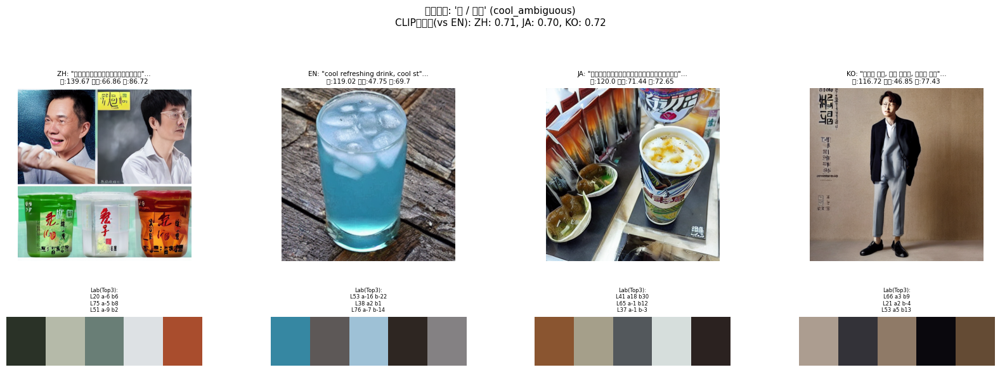

  概念 'cool_ambiguous' 分析完畢。


處理概念 #2: '柔軟' (soft_ambiguous)
  [1. CLIP嵌入分析]
  CLIP文本嵌入向量餘弦相似度 (vs 'EN'):
    - 與 ZH: 0.670
    - 與 JA: 0.722
    - 與 KO: 0.611
  [2. 圖像生成、顏色與全局特徵分析]


  'soft_ambiguous'語言處理:   0%|          | 0/4 [00:00<?, ?it/s]

    -> ZH: '柔軟，溫和的觸感，蓬鬆的雲朵'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【柔軟】| 語言提示: 【ZH: 柔軟，溫和的觸感，蓬鬆的雲朵...】 ---
圖像主要色票 (HEX): #c13381, #171517, #c5bfbf ...
全局圖像特徵: 亮度=112.45, 對比度=60.24, 飽和度=51.73

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> EN: 'soft, gentle touch, fluffy clouds'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【柔軟】| 語言提示: 【EN: soft, gentle touch, fluffy clouds...】 ---
圖像主要色票 (HEX): #90979f, #c9caca, #1d4173 ...
全局圖像特徵: 亮度=122.23, 對比度=53.28, 飽和度=90.92

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> JA: '柔らかい、優しい手触り、ふわふわの雲'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【柔軟】| 語言提示: 【JA: 柔らかい、優しい手触り、ふわふわの雲...】 ---
圖像主要色票 (HEX): #65bce8, #393f43, #b24150 ...
全局圖像特徵: 亮度=119.55, 對比度=61.4, 飽和度=100.52

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> KO: '부드럽다, 순한 촉감, 푹신한 구름'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【柔軟】| 語言提示: 【KO: 부드럽다, 순한 촉감, 푹신한 구름...】 ---
圖像主要色票 (HEX): #95938f, #4e4b49, #72706d ...
全局圖像特徵: 亮度=111.72, 對比度=60.49, 飽和度=23.95

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------


  [3. 繪製結果圖表]


<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 26580 (\N{CJK UNIFIED IDEOGRAPH-67D4}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 36575 (\N{CJK UNIFIED IDEOGRAPH-8EDF}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 65292 (\N{FULLWIDTH COMMA}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 28331 (\N{CJK UNIFIED IDEOGRAPH-6EAB}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 21644 (\N{CJK UNIFIED IDEOGRAPH-548C}) missing from font(s) Deja

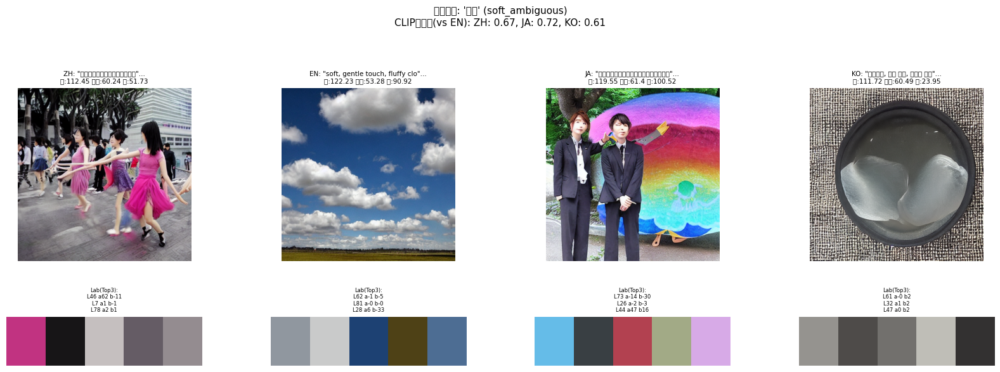

  概念 'soft_ambiguous' 分析完畢。


處理概念 #3: '明亮' (bright_ambiguous)
  [1. CLIP嵌入分析]
  CLIP文本嵌入向量餘弦相似度 (vs 'EN'):
    - 與 ZH: 0.736
    - 與 JA: 0.733
    - 與 KO: 0.656
  [2. 圖像生成、顏色與全局特徵分析]


  'bright_ambiguous'語言處理:   0%|          | 0/4 [00:00<?, ?it/s]

    -> ZH: '明亮的光線，充滿希望的未來，聰明睿智的想法'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【明亮】| 語言提示: 【ZH: 明亮的光線，充滿希望的未來，聰明睿智的想法...】 ---
圖像主要色票 (HEX): #373d3b, #c6c0b7, #549fca ...
全局圖像特徵: 亮度=122.12, 對比度=54.28, 飽和度=97.95

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> EN: 'bright light, hopeful future, intelligent idea'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【明亮】| 語言提示: 【EN: bright light, hopeful future, intelligent idea...】 ---
圖像主要色票 (HEX): #7a7f89, #e2d17b, #f2f2d0 ...
全局圖像特徵: 亮度=144.57, 對比度=36.59, 飽和度=34.55

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> JA: '明るい光、希望に満ちた未来、賢いアイデア'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【明亮】| 語言提示: 【JA: 明るい光、希望に満ちた未来、賢いアイデア...】 ---
圖像主要色票 (HEX): #f1e0c6, #282628, #cda085 ...
全局圖像特徵: 亮度=97.93, 對比度=75.02, 飽和度=58.88

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> KO: '밝은 빛, 희망찬 미래, 똑똑한 생각'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【明亮】| 語言提示: 【KO: 밝은 빛, 희망찬 미래, 똑똑한 생각...】 ---
圖像主要色票 (HEX): #171420, #c0af9b, #938071 ...
全局圖像特徵: 亮度=118.8, 對比度=75.83, 飽和度=65.71

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------


  [3. 繪製結果圖表]


<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 26126 (\N{CJK UNIFIED IDEOGRAPH-660E}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 20142 (\N{CJK UNIFIED IDEOGRAPH-4EAE}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 30340 (\N{CJK UNIFIED IDEOGRAPH-7684}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 20809 (\N{CJK UNIFIED IDEOGRAPH-5149}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 32218 (\N{CJK UNIFIED IDEOGRAPH-7DDA}) missing from f

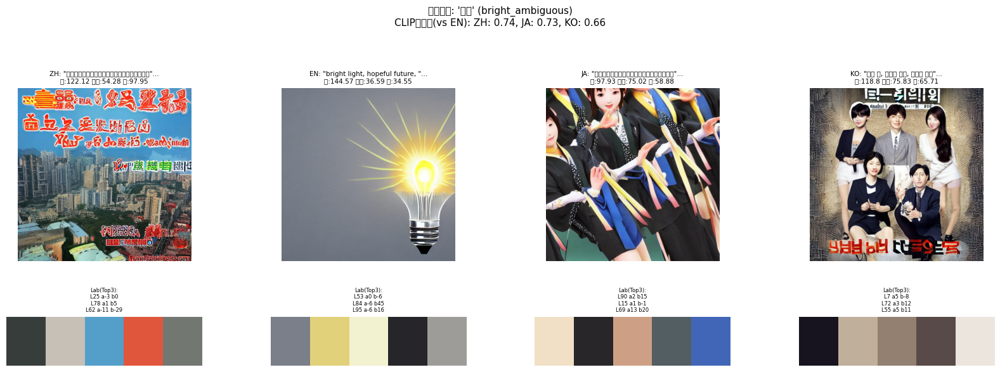

  概念 'bright_ambiguous' 分析完畢。


處理概念 #4: '黑暗' (dark_ambiguous)
  [1. CLIP嵌入分析]
  CLIP文本嵌入向量餘弦相似度 (vs 'EN'):
    - 與 ZH: 0.677
    - 與 JA: 0.660
    - 與 KO: 0.629
  [2. 圖像生成、顏色與全局特徵分析]


  'dark_ambiguous'語言處理:   0%|          | 0/4 [00:00<?, ?it/s]

    -> ZH: '漆黑的夜晚，神秘的森林深處，陰沉憂鬱的心情'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【黑暗】| 語言提示: 【ZH: 漆黑的夜晚，神秘的森林深處，陰沉憂鬱的心情...】 ---
圖像主要色票 (HEX): #cbddd7, #2c2a3c, #a88770 ...
全局圖像特徵: 亮度=111.02, 對比度=62.86, 飽和度=86.73

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> EN: 'dark night, mysterious deep forest, gloomy mood'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【黑暗】| 語言提示: 【EN: dark night, mysterious deep forest, gloomy mood...】 ---
圖像主要色票 (HEX): #aab592, #414a3d, #788368 ...
全局圖像特徵: 亮度=111.64, 對比度=76.75, 飽和度=49.33

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> JA: '漆黒の夜、神秘的な森の奥、陰鬱な気分'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【黑暗】| 語言提示: 【JA: 漆黒の夜、神秘的な森の奥、陰鬱な気分...】 ---
圖像主要色票 (HEX): #313852, #a3b1b9, #e3f1f1 ...
全局圖像特徵: 亮度=96.55, 對比度=85.35, 飽和度=96.57

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> KO: '칠흑 같은 밤, 신비로운 깊은 숲, 침울한 기분'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【黑暗】| 語言提示: 【KO: 칠흑 같은 밤, 신비로운 깊은 숲, 침울한 기분...】 ---
圖像主要色票 (HEX): #bdb8b7, #24191b, #e3dedd ...
全局圖像特徵: 亮度=145.51, 對比度=72.08, 飽和度=34.82

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------


  [3. 繪製結果圖表]


<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 28422 (\N{CJK UNIFIED IDEOGRAPH-6F06}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 40657 (\N{CJK UNIFIED IDEOGRAPH-9ED1}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 30340 (\N{CJK UNIFIED IDEOGRAPH-7684}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 22812 (\N{CJK UNIFIED IDEOGRAPH-591C}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 26202 (\N{CJK UNIFIED IDEOGRAPH-665A}) missing from f

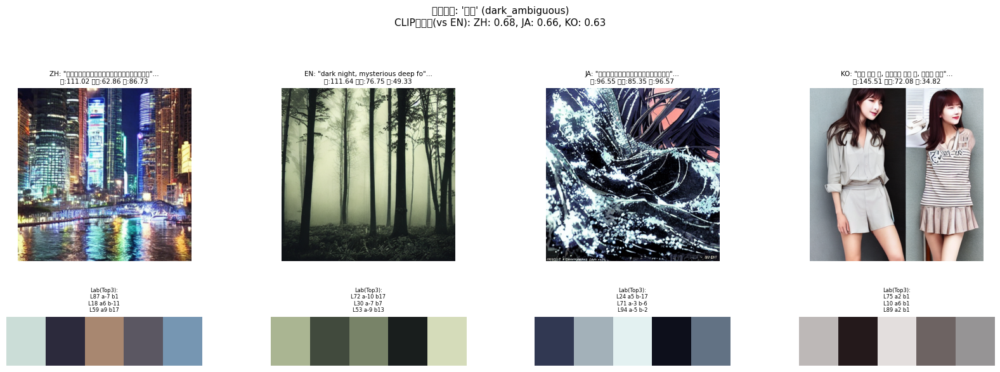

  概念 'dark_ambiguous' 分析完畢。


處理概念 #5: '純潔' (pure_ambiguous)
  [1. CLIP嵌入分析]
  CLIP文本嵌入向量餘弦相似度 (vs 'EN'):
    - 與 ZH: 0.697
    - 與 JA: 0.695
    - 與 KO: 0.619
  [2. 圖像生成、顏色與全局特徵分析]


  'pure_ambiguous'語言處理:   0%|          | 0/4 [00:00<?, ?it/s]

    -> ZH: '純潔的心靈，單純的想法，純淨無瑕的白色'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【純潔】| 語言提示: 【ZH: 純潔的心靈，單純的想法，純淨無瑕的白色...】 ---
圖像主要色票 (HEX): #1f1d1d, #a6a39e, #716c64 ...
全局圖像特徵: 亮度=106.61, 對比度=66.53, 飽和度=41.26

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> EN: 'pure heart, simple idea, pristine flawless white'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【純潔】| 語言提示: 【EN: pure heart, simple idea, pristine flawless white...】 ---
圖像主要色票 (HEX): #746c53, #bbc6d3, #51442b ...
全局圖像特徵: 亮度=130.19, 對比度=50.73, 飽和度=67.06

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> JA: '純粋な心、単純な考え、清らかで無垢な白'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【純潔】| 語言提示: 【JA: 純粋な心、単純な考え、清らかで無垢な白...】 ---
圖像主要色票 (HEX): #dccfdb, #29231f, #8b8d95 ...
全局圖像特徵: 亮度=104.02, 對比度=60.61, 飽和度=74.99

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> KO: '순수한 마음, 단순한 생각, 깨끗하고 티없는 흰색'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【純潔】| 語言提示: 【KO: 순수한 마음, 단순한 생각, 깨끗하고 티없는 흰색...】 ---
圖像主要色票 (HEX): #55554f, #c1bfb8, #748daf ...
全局圖像特徵: 亮度=116.78, 對比度=55.49, 飽和度=61.43

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------


  [3. 繪製結果圖表]


<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 32020 (\N{CJK UNIFIED IDEOGRAPH-7D14}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 28500 (\N{CJK UNIFIED IDEOGRAPH-6F54}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 30340 (\N{CJK UNIFIED IDEOGRAPH-7684}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 24515 (\N{CJK UNIFIED IDEOGRAPH-5FC3}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 38728 (\N{CJK UNIFIED IDEOGRAPH-9748}) missing from f

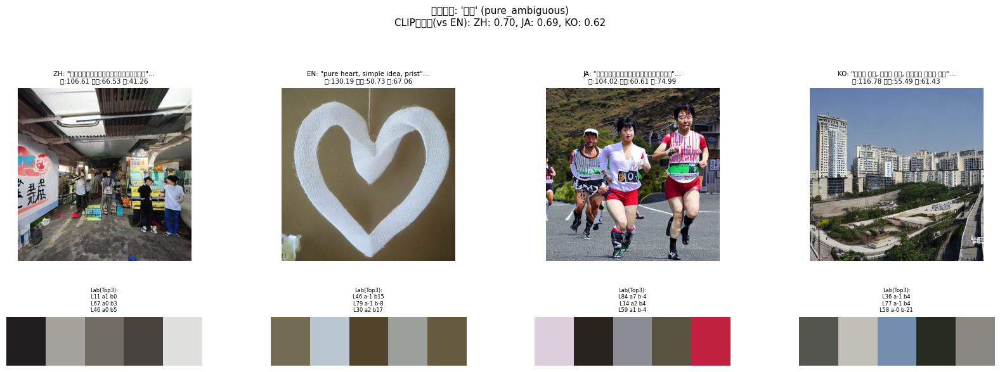

  概念 'pure_ambiguous' 分析完畢。


處理概念 #6: '溫暖' (warm_ambiguous)
  [1. CLIP嵌入分析]
  CLIP文本嵌入向量餘弦相似度 (vs 'EN'):
    - 與 ZH: 0.743
    - 與 JA: 0.694
    - 與 KO: 0.690
  [2. 圖像生成、顏色與全局特徵分析]


  'warm_ambiguous'語言處理:   0%|          | 0/4 [00:00<?, ?it/s]

    -> ZH: '溫暖的陽光灑在身上，壁爐裡溫暖的火焰，熱情的款待'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【溫暖】| 語言提示: 【ZH: 溫暖的陽光灑在身上，壁爐裡溫暖的火焰，熱情的款待...】 ---
圖像主要色票 (HEX): #a399a3, #32282d, #6e6062 ...
全局圖像特徵: 亮度=130.12, 對比度=58.45, 飽和度=44.04

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> EN: 'warm sunshine on the skin, cozy fireplace flames, enthusiastic hospitality'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【溫暖】| 語言提示: 【EN: warm sunshine on the skin, cozy fireplace flames, enthusiastic hos...】 ---
圖像主要色票 (HEX): #231311, #b0b3ae, #968372 ...
全局圖像特徵: 亮度=122.41, 對比度=56.21, 飽和度=81.77

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> JA: '肌に注ぐ暖かい日差し、暖炉の暖かい炎、情熱的なもてなし'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【溫暖】| 語言提示: 【JA: 肌に注ぐ暖かい日差し、暖炉の暖かい炎、情熱的なもてなし...】 ---
圖像主要色票 (HEX): #523029, #ebf0f2, #b8bdc2 ...
全局圖像特徵: 亮度=108.22, 對比度=85.8, 飽和度=95.52

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> KO: '피부에 내리쬐는 따뜻한 햇살, 벽난로의 따뜻한 불꽃, 열정적인 환대'


  0%|          | 0/22 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)



--- 解釋模板 for 概念:【溫暖】| 語言提示: 【KO: 피부에 내리쬐는 따뜻한 햇살, 벽난로의 따뜻한 불꽃, 열정적인 환대...】 ---
圖像主要色票 (HEX): #000000, #000000, #000000 ...
全局圖像特徵: 亮度=0.0, 對比度=0.0, 飽和度=0.0

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------


  [3. 繪製結果圖表]


<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 28331 (\N{CJK UNIFIED IDEOGRAPH-6EAB}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 26262 (\N{CJK UNIFIED IDEOGRAPH-6696}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 30340 (\N{CJK UNIFIED IDEOGRAPH-7684}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 38525 (\N{CJK UNIFIED IDEOGRAPH-967D}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 20809 (\N{CJK UNIFIED IDEOGRAPH-5149}) missing from f

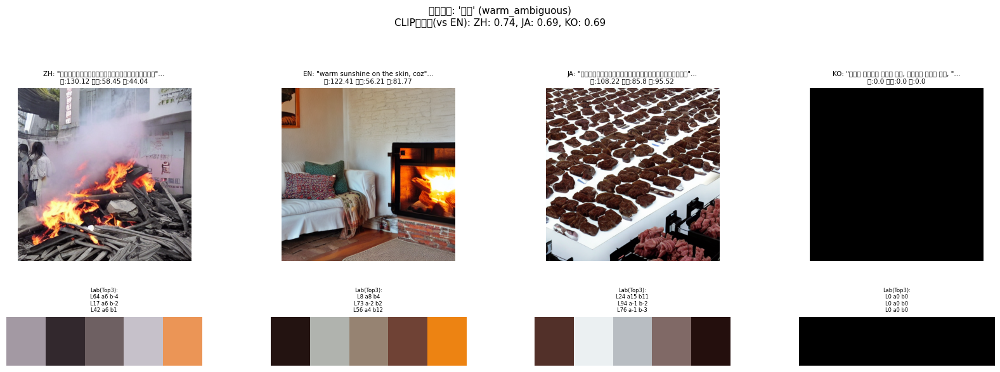

  概念 'warm_ambiguous' 分析完畢。


處理概念 #7: '快樂' (happy_clear)
  [1. CLIP嵌入分析]
  CLIP文本嵌入向量餘弦相似度 (vs 'EN'):
    - 與 ZH: 0.601
    - 與 JA: 0.589
    - 與 KO: 0.554
  [2. 圖像生成、顏色與全局特徵分析]


  'happy_clear'語言處理:   0%|          | 0/4 [00:00<?, ?it/s]

    -> ZH: '陽光明媚的日子裡孩子們快樂的笑容，五彩繽紛的派對氣球'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【快樂】| 語言提示: 【ZH: 陽光明媚的日子裡孩子們快樂的笑容，五彩繽紛的派對氣球...】 ---
圖像主要色票 (HEX): #605951, #463e38, #9d958a ...
全局圖像特徵: 亮度=91.57, 對比度=36.29, 飽和度=43.9

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> EN: 'children's happy smiles on a sunny day, colorful party balloons'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【快樂】| 語言提示: 【EN: children's happy smiles on a sunny day, colorful party balloons...】 ---
圖像主要色票 (HEX): #318d35, #ce2850, #d6b4b2 ...
全局圖像特徵: 亮度=141.37, 對比度=46.71, 飽和度=189.65

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> JA: '晴れた日の子供たちの幸せな笑顔、カラフルなパーティーバルーン'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【快樂】| 語言提示: 【JA: 晴れた日の子供たちの幸せな笑顔、カラフルなパーティーバルーン...】 ---
圖像主要色票 (HEX): #91949f, #192218, #5f5851 ...
全局圖像特徵: 亮度=113.15, 對比度=66.51, 飽和度=96.49

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> KO: '화창한 날 아이들의 행복한 미소, 다채로운 파티 풍선'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【快樂】| 語言提示: 【KO: 화창한 날 아이들의 행복한 미소, 다채로운 파티 풍선...】 ---
圖像主要色票 (HEX): #9f8980, #564d51, #e7d7c3 ...
全局圖像特徵: 亮度=122.28, 對比度=40.03, 飽和度=48.81

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------


  [3. 繪製結果圖表]


<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 38525 (\N{CJK UNIFIED IDEOGRAPH-967D}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 20809 (\N{CJK UNIFIED IDEOGRAPH-5149}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 26126 (\N{CJK UNIFIED IDEOGRAPH-660E}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 23194 (\N{CJK UNIFIED IDEOGRAPH-5A9A}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 30340 (\N{CJK UNIFIED IDEOGRAPH-7684}) missing from f

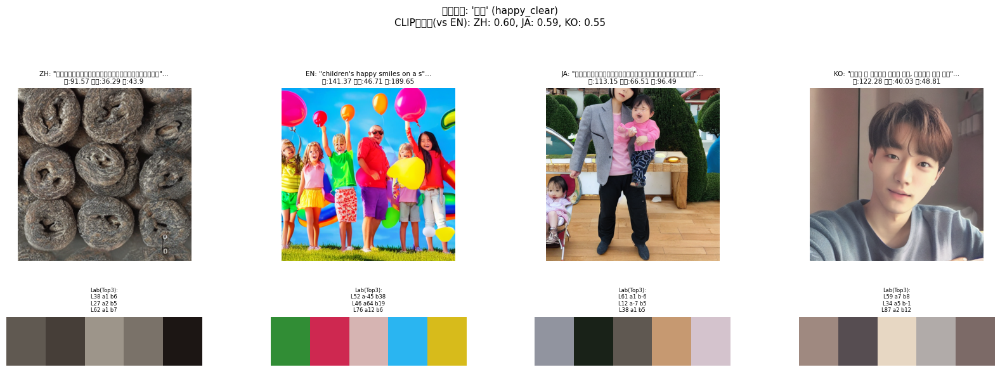

  概念 'happy_clear' 分析完畢。


處理概念 #8: '生氣' (angry_clear)
  [1. CLIP嵌入分析]
  CLIP文本嵌入向量餘弦相似度 (vs 'EN'):
    - 與 ZH: 0.704
    - 與 JA: 0.659
    - 與 KO: 0.626
  [2. 圖像生成、顏色與全局特徵分析]


  'angry_clear'語言處理:   0%|          | 0/4 [00:00<?, ?it/s]

    -> ZH: '因為不公正而生氣的表情，緊握的拳頭，火山爆發的瞬間'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【生氣】| 語言提示: 【ZH: 因為不公正而生氣的表情，緊握的拳頭，火山爆發的瞬間...】 ---
圖像主要色票 (HEX): #cacbcb, #3b3a36, #878382 ...
全局圖像特徵: 亮度=111.02, 對比度=66.18, 飽和度=40.47

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> EN: 'angry expression due to injustice, clenched fists, moment of volcanic eruption'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【生氣】| 語言提示: 【EN: angry expression due to injustice, clenched fists, moment of volca...】 ---
圖像主要色票 (HEX): #858385, #090909, #383738 ...
全局圖像特徵: 亮度=104.18, 對比度=56.16, 飽和度=17.66

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> JA: '不正に対する怒りの表情、握りしめた拳、火山噴火の瞬間'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【生氣】| 語言提示: 【JA: 不正に対する怒りの表情、握りしめた拳、火山噴火の瞬間...】 ---
圖像主要色票 (HEX): #9ea3b0, #5a5657, #2a2729 ...
全局圖像特徵: 亮度=116.73, 對比度=52.31, 飽和度=23.6

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> KO: '불의로 인한 화난 표정, 꽉 쥔 주먹, 화산 폭발의 순간'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【生氣】| 語言提示: 【KO: 불의로 인한 화난 표정, 꽉 쥔 주먹, 화산 폭발의 순간...】 ---
圖像主要色票 (HEX): #85898b, #626457, #50677e ...
全局圖像特徵: 亮度=115.42, 對比度=40.55, 飽和度=60.23

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------


  [3. 繪製結果圖表]


<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 22240 (\N{CJK UNIFIED IDEOGRAPH-56E0}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 28858 (\N{CJK UNIFIED IDEOGRAPH-70BA}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 19981 (\N{CJK UNIFIED IDEOGRAPH-4E0D}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 20844 (\N{CJK UNIFIED IDEOGRAPH-516C}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 27491 (\N{CJK UNIFIED IDEOGRAPH-6B63}) missing from f

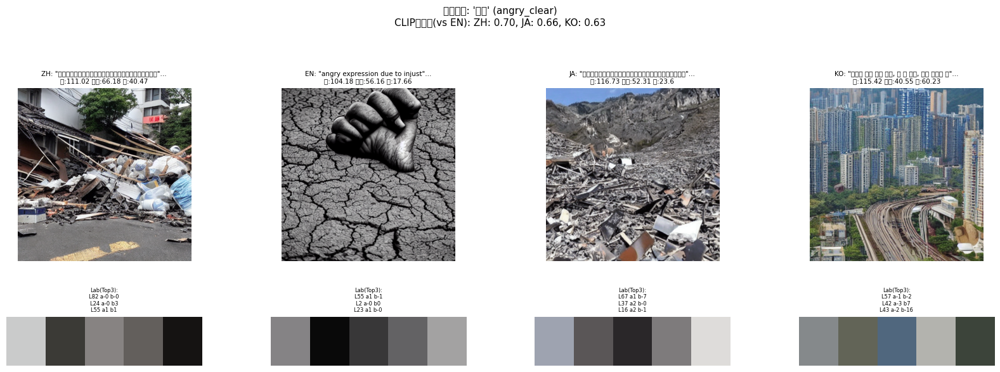

  概念 'angry_clear' 分析完畢。


處理概念 #9: '傷心' (sad_clear)
  [1. CLIP嵌入分析]
  CLIP文本嵌入向量餘弦相似度 (vs 'EN'):
    - 與 ZH: 0.696
    - 與 JA: 0.642
    - 與 KO: 0.640
  [2. 圖像生成、顏色與全局特徵分析]


  'sad_clear'語言處理:   0%|          | 0/4 [00:00<?, ?it/s]

    -> ZH: '因為失去而傷心的眼淚，陰雨連綿的窗外，孤獨的流浪貓'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【傷心】| 語言提示: 【ZH: 因為失去而傷心的眼淚，陰雨連綿的窗外，孤獨的流浪貓...】 ---
圖像主要色票 (HEX): #262827, #797978, #d0d5da ...
全局圖像特徵: 亮度=106.32, 對比度=53.21, 飽和度=36.04

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> EN: 'sad tears shed for a loss, continuous rainy weather outside the window, a lonely stray cat'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【傷心】| 語言提示: 【EN: sad tears shed for a loss, continuous rainy weather outside the wi...】 ---
圖像主要色票 (HEX): #8e9294, #4c4949, #c1c7ca ...
全局圖像特徵: 亮度=114.58, 對比度=51.01, 飽和度=44.17

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> JA: '喪失による悲しい涙、窓の外の長引く雨天、孤独な野良猫'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【傷心】| 語言提示: 【JA: 喪失による悲しい涙、窓の外の長引く雨天、孤独な野良猫...】 ---
圖像主要色票 (HEX): #5b5b52, #707266, #d6d8d3 ...
全局圖像特徵: 亮度=107.98, 對比度=35.74, 飽和度=37.61

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> KO: '상실감에 흘리는 슬픈 눈물, 창밖의 계속되는 비 오는 날씨, 외로운 길고양이'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【傷心】| 語言提示: 【KO: 상실감에 흘리는 슬픈 눈물, 창밖의 계속되는 비 오는 날씨, 외로운 길고양이...】 ---
圖像主要色票 (HEX): #967958, #d8d6d8, #544f39 ...
全局圖像特徵: 亮度=129.35, 對比度=64.19, 飽和度=72.13

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------


  [3. 繪製結果圖表]


<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 22240 (\N{CJK UNIFIED IDEOGRAPH-56E0}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 28858 (\N{CJK UNIFIED IDEOGRAPH-70BA}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 22833 (\N{CJK UNIFIED IDEOGRAPH-5931}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 21435 (\N{CJK UNIFIED IDEOGRAPH-53BB}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 32780 (\N{CJK UNIFIED IDEOGRAPH-800C}) missing from f

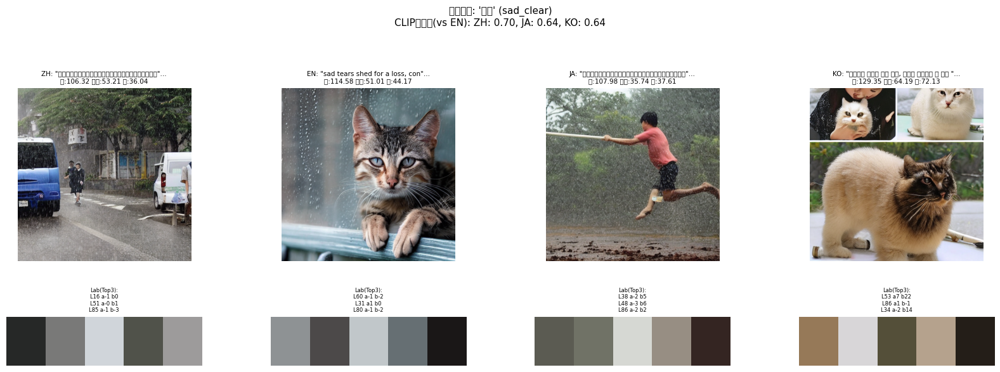

  概念 'sad_clear' 分析完畢。


處理概念 #10: '驚訝' (surprised_clear)
  [1. CLIP嵌入分析]
  CLIP文本嵌入向量餘弦相似度 (vs 'EN'):
    - 與 ZH: 0.723
    - 與 JA: 0.667
    - 與 KO: 0.690
  [2. 圖像生成、顏色與全局特徵分析]


  'surprised_clear'語言處理:   0%|          | 0/4 [00:00<?, ?it/s]

    -> ZH: '收到意想不到的生日驚喜時驚訝的表情，魔術師的奇妙戲法'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【驚訝】| 語言提示: 【ZH: 收到意想不到的生日驚喜時驚訝的表情，魔術師的奇妙戲法...】 ---
圖像主要色票 (HEX): #d9d8d1, #4a4b47, #aca695 ...
全局圖像特徵: 亮度=101.76, 對比度=59.69, 飽和度=27.61

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> EN: 'surprised expression upon receiving an unexpected birthday surprise, a magician's wonderful trick'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【驚訝】| 語言提示: 【EN: surprised expression upon receiving an unexpected birthday surpris...】 ---
圖像主要色票 (HEX): #3a252b, #7b8a8e, #dbe5dc ...
全局圖像特徵: 亮度=132.22, 對比度=75.33, 飽和度=93.79

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> JA: '予期せぬ誕生日サプライズに驚いた表情、マジシャンの見事な手品'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【驚訝】| 語言提示: 【JA: 予期せぬ誕生日サプライズに驚いた表情、マジシャンの見事な手品...】 ---
圖像主要色票 (HEX): #ba9c92, #62412e, #d8c9cb ...
全局圖像特徵: 亮度=106.0, 對比度=78.44, 飽和度=94.25

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> KO: '예상치 못한 생일 서프라이즈를 받았을 때 놀란 표정, 마술사의 멋진 마술'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【驚訝】| 語言提示: 【KO: 예상치 못한 생일 서프라이즈를 받았을 때 놀란 표정, 마술사의 멋진 마술...】 ---
圖像主要色票 (HEX): #90908a, #1f1922, #bcbfbf ...
全局圖像特徵: 亮度=125.13, 對比度=79.29, 飽和度=56.06

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------


  [3. 繪製結果圖表]


<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 25910 (\N{CJK UNIFIED IDEOGRAPH-6536}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 21040 (\N{CJK UNIFIED IDEOGRAPH-5230}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 24847 (\N{CJK UNIFIED IDEOGRAPH-610F}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 24819 (\N{CJK UNIFIED IDEOGRAPH-60F3}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 19981 (\N{CJK UNIFIED IDEOGRAPH-4E0D}) missing from f

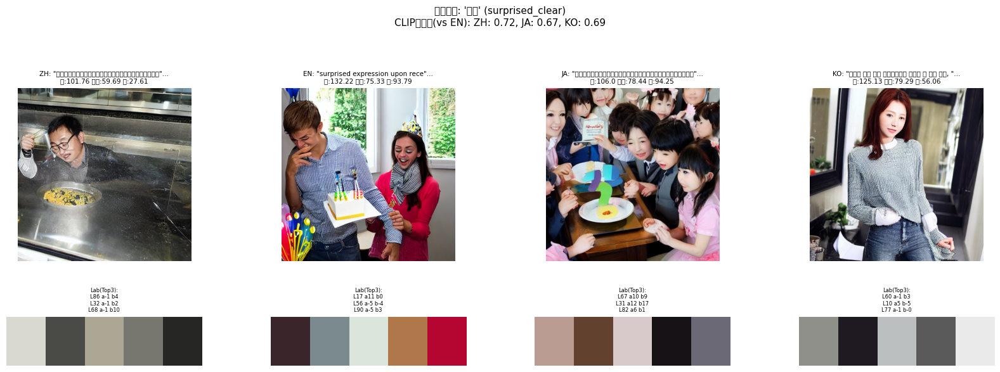

  概念 'surprised_clear' 分析完畢。


處理概念 #11: '餓' (hungry_clear)
  [1. CLIP嵌入分析]
  CLIP文本嵌入向量餘弦相似度 (vs 'EN'):
    - 與 ZH: 0.734
    - 與 JA: 0.735
    - 與 KO: 0.697
  [2. 圖像生成、顏色與全局特徵分析]


  'hungry_clear'語言處理:   0%|          | 0/4 [00:00<?, ?it/s]

    -> ZH: '肚子餓得咕咕叫，餐桌上豐盛美味的晚餐'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【餓】| 語言提示: 【ZH: 肚子餓得咕咕叫，餐桌上豐盛美味的晚餐...】 ---
圖像主要色票 (HEX): #a49c84, #1d1715, #d5dacc ...
全局圖像特徵: 亮度=103.42, 對比度=69.22, 飽和度=109.45

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> EN: 'stomach rumbling with hunger, a hearty and delicious dinner on the table'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【餓】| 語言提示: 【EN: stomach rumbling with hunger, a hearty and delicious dinner on the...】 ---
圖像主要色票 (HEX): #e7eeee, #322a2d, #cb8225 ...
全局圖像特徵: 亮度=110.36, 對比度=78.55, 飽和度=97.08

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> JA: 'お腹が空いてグーグー鳴る、食卓の上の豊かで美味しい夕食'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【餓】| 語言提示: 【JA: お腹が空いてグーグー鳴る、食卓の上の豊かで美味しい夕食...】 ---
圖像主要色票 (HEX): #667081, #bebbb5, #939294 ...
全局圖像特徵: 亮度=122.48, 對比度=43.03, 飽和度=54.2

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> KO: '배가 고파 꼬르륵 소리가 나다, 식탁 위의 푸짐하고 맛있는 저녁 식사'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【餓】| 語言提示: 【KO: 배가 고파 꼬르륵 소리가 나다, 식탁 위의 푸짐하고 맛있는 저녁 식사...】 ---
圖像主要色票 (HEX): #2e1f1c, #bbada3, #a08777 ...
全局圖像特徵: 亮度=131.69, 對比度=61.14, 飽和度=60.6

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------


  [3. 繪製結果圖表]


<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 32922 (\N{CJK UNIFIED IDEOGRAPH-809A}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 23376 (\N{CJK UNIFIED IDEOGRAPH-5B50}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 39187 (\N{CJK UNIFIED IDEOGRAPH-9913}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 24471 (\N{CJK UNIFIED IDEOGRAPH-5F97}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 21653 (\N{CJK UNIFIED IDEOGRAPH-5495}) missing from f

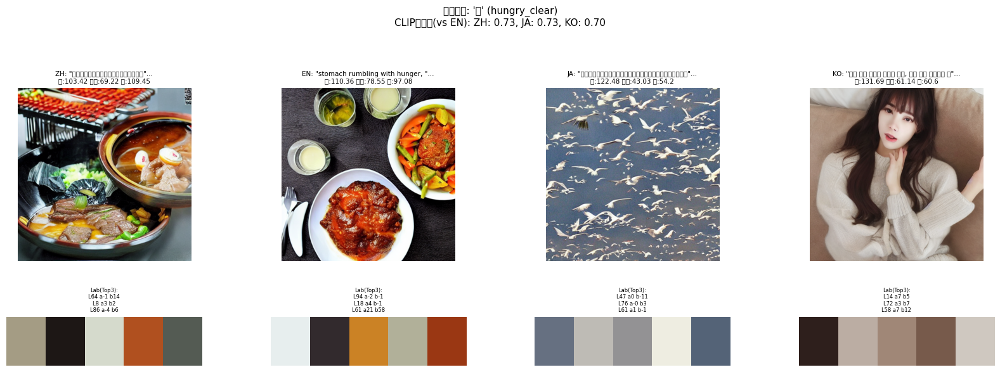

  概念 'hungry_clear' 分析完畢。


處理概念 #12: '疲憊' (tired_clear)
  [1. CLIP嵌入分析]
  CLIP文本嵌入向量餘弦相似度 (vs 'EN'):
    - 與 ZH: 0.802
    - 與 JA: 0.748
    - 與 KO: 0.757
  [2. 圖像生成、顏色與全局特徵分析]


  'tired_clear'語言處理:   0%|          | 0/4 [00:00<?, ?it/s]

    -> ZH: '長時間工作後感到身心疲憊，舒適柔軟的床鋪'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【疲憊】| 語言提示: 【ZH: 長時間工作後感到身心疲憊，舒適柔軟的床鋪...】 ---
圖像主要色票 (HEX): #252b1d, #969a9e, #4c4f46 ...
全局圖像特徵: 亮度=121.2, 對比度=54.39, 飽和度=37.64

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> EN: 'feeling mentally and physically exhausted after long hours of work, a comfortable and soft bed'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【疲憊】| 語言提示: 【EN: feeling mentally and physically exhausted after long hours of work...】 ---
圖像主要色票 (HEX): #42291a, #bab0a1, #8a7967 ...
全局圖像特徵: 亮度=110.07, 對比度=48.17, 飽和度=87.76

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> JA: '長時間の仕事の後で心身ともに疲れ果てた、快適で柔らかいベッド'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【疲憊】| 語言提示: 【JA: 長時間の仕事の後で心身ともに疲れ果てた、快適で柔らかいベッド...】 ---
圖像主要色票 (HEX): #a15223, #807f84, #45342e ...
全局圖像特徵: 亮度=123.54, 對比度=35.63, 飽和度=31.86

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------

    -> KO: '장시간 작업 후 심신이 지친 상태, 편안하고 부드러운 침대'


  0%|          | 0/22 [00:00<?, ?it/s]


--- 解釋模板 for 概念:【疲憊】| 語言提示: 【KO: 장시간 작업 후 심신이 지친 상태, 편안하고 부드러운 침대...】 ---
圖像主要色票 (HEX): #716c6d, #100b0c, #dbc9bd ...
全局圖像特徵: 亮度=103.8, 對比度=50.71, 飽和度=33.83

原因推測與圖像描述 (請您填充)：
   [請結合以上客觀指標和您的觀察，詳細闡述：
    a. 圖像視覺風格與氛圍？
    b. 主要元素與提示詞的關聯？
    c. 色彩運用如何詮釋提示詞？
    d. (特定語言)文化背景的可能影響？(例如韓國圖像為何常出現人物?)
    e. 與其他語言生成圖像的差異及可能原因？]
--------------------------------------------------------------------------


  [3. 繪製結果圖表]


<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 38263 (\N{CJK UNIFIED IDEOGRAPH-9577}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 26178 (\N{CJK UNIFIED IDEOGRAPH-6642}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 38291 (\N{CJK UNIFIED IDEOGRAPH-9593}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 24037 (\N{CJK UNIFIED IDEOGRAPH-5DE5}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0,0,1,0.94]); plt.subplots_adjust(hspace=0.5, wspace=0.3); plt.show()
<ipython-input-15-7aff838c066e>:38: UserWarning: Glyph 20316 (\N{CJK UNIFIED IDEOGRAPH-4F5C}) missing from f

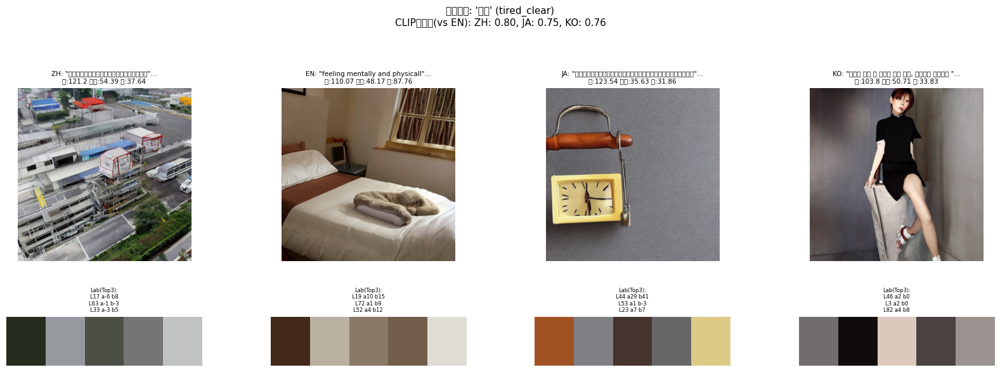

  概念 'tired_clear' 分析完畢。


所有詞彙概念處理完成！解釋模板已在上方打印。


In [16]:
# 16: 主程式

print(f"Cell 15: 即將開始執行主流程，處理 {len(word_concepts_to_process)} 個詞彙概念...")
BASE_SEED = 20240101 # 可以更改基礎種子以獲得不同的圖像系列
SD_STEPS = 22 # 推斷步數可以適當減少以加速，20-25通常是不錯的平衡
SD_CFG = 7.0  # 指導比例
NUM_DOM_COLORS = 5
SAVE_IMAGES_FLAG = True
IMAGES_OUT_DIR = "project_outputs_final_v4"

if SAVE_IMAGES_FLAG and not os.path.exists(IMAGES_OUT_DIR):
    os.makedirs(IMAGES_OUT_DIR); print(f"  已建立圖像儲存目錄: {IMAGES_OUT_DIR}")

results_collection = []

for concept_idx, concept_detail in enumerate(tqdm(word_concepts_to_process, desc="總體概念處理")):
    concept_id = concept_detail["concept_name"]; base_zh = concept_detail["base_chinese"]
    prompts = concept_detail["translations"]
    print(f"\n\n處理概念 #{concept_idx+1}: '{base_zh}' ({concept_id})")

    print("  [1. CLIP嵌入分析]")
    embeddings = get_clip_text_embeddings_vector(prompts, clip_model_instance, device_to_use)
    similarities = calculate_and_print_embedding_similarity(embeddings, reference_lang='en')

    print("  [2. 圖像生成、顏色與全局特徵分析]")
    concept_images = {}; concept_colors = {}; concept_global_features = {}
    concept_explanations_str = ""

    for lang_idx, (lang, prompt) in enumerate(tqdm(prompts.items(), desc=f"  '{concept_id}'語言處理", leave=False)):
        print(f"    -> {lang.upper()}: '{prompt}'")
        img_seed = BASE_SEED + concept_idx*100 + lang_idx*10
        pil_img = generate_actual_image_with_sd(prompt,image_generation_pipeline,img_seed,SD_STEPS,SD_CFG,device_to_use)
        concept_images[lang] = pil_img

        if SAVE_IMAGES_FLAG and pil_img:
            try:
                fname = f"{concept_id}_{lang}_s{img_seed}.png"; fpath = os.path.join(IMAGES_OUT_DIR,fname)
                pil_img.save(fpath)
            except Exception as e: print(f"      儲存圖像'{fname}'失敗: {e}")

        rgb_cs, lab_cs = extract_dominant_colors_from_image(pil_img, NUM_DOM_COLORS)
        concept_colors[lang] = (rgb_cs, lab_cs)
        global_feats = analyze_global_image_features(pil_img) # 分析全局特徵
        concept_global_features[lang] = global_feats # 儲存全局特徵

        expl_text = generate_explanation_for_image(base_zh, f"{lang.upper()}: {prompt}", pil_img,
                                                 [f"#{c[0]:02x}{c[1]:02x}{c[2]:02x}" for c in rgb_cs],
                                                 global_feats) # 傳遞全局特徵給解釋模板
        print(expl_text)
        concept_explanations_str += expl_text

        if device_to_use=="cuda": torch.cuda.empty_cache(); time.sleep(0.05)

    print("\n  [3. 繪製結果圖表]")
    plot_full_concept_results_chart(concept_id,base_zh,prompts,concept_images,concept_colors,similarities,concept_global_features)

    results_collection.append({"concept":concept_id,"base_chinese":base_zh, "prompts":prompts, "similarities":similarities,
                               "global_features": concept_global_features, # 保存全局特徵
                               "explanation_prompts":concept_explanations_str}) # 保存解釋模板
    print(f"  概念 '{concept_id}' 分析完畢。")
    if device_to_use=="cuda": torch.cuda.empty_cache()

print("\n\n所有詞彙概念處理完成！解釋模板已在上方打印。")
# 可選: 保存 results_collection 到 JSON
# ... (參考之前版本的JSON保存代碼，記得處理NpEncoder)